In [29]:
import pandas as pd
import sqlite3
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Az adatbázis fájl elérési útvonala
db_file = './nba.sqlite'

conn = None # Inicializáljuk a conn változót

try:
    conn = sqlite3.connect(db_file)

    # Adatok betöltése a most már biztosan helyes táblanevekkel
    game_df = pd.read_sql_query("SELECT * FROM game;", conn)
    player_df = pd.read_sql_query("SELECT * FROM player;", conn)
    team_df = pd.read_sql_query("SELECT * FROM team;", conn)
    common_player_info_df = pd.read_sql_query("SELECT * FROM common_player_info;", conn)

except sqlite3.Error as e:
    print(f"Hiba történt az adatbázishoz való csatlakozáskor vagy lekérdezéskor: {e}")
finally:
    if conn:
        conn.close()

def convert_height_to_cm(height_str):
    if pd.isna(height_str):
        return None
    parts = str(height_str).split('-')
    if len(parts) == 2:
        try:
            feet = int(parts[0])
            inches = int(parts[1])
            total_inches = (feet * 12) + inches
            return total_inches * 2.54 # 1 inch = 2.54 cm
        except ValueError:
            return None
    return None

common_player_info_df['height_in_cm'] = common_player_info_df['height'].apply(convert_height_to_cm)

common_player_info_df['weight_in_kg'] = pd.to_numeric(common_player_info_df['weight'], errors='coerce')
common_player_info_df['weight_in_kg'] = common_player_info_df['weight_in_kg'] * 0.453592


game_df['game_date'] = pd.to_datetime(game_df['game_date'])

player_full_df = pd.merge(player_df, common_player_info_df, left_on='id', right_on='person_id', how='left')

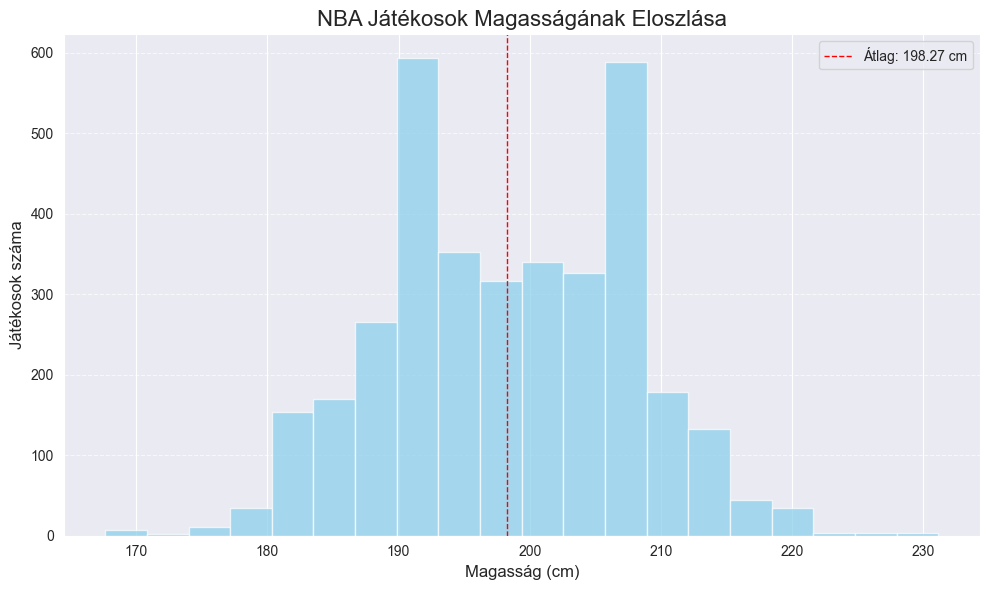

In [8]:
plt.figure(figsize=(10, 6))
plt.hist(player_full_df['height_in_cm'].dropna(), bins=20, edgecolor='black', alpha=0.0)
plt.hist(player_full_df['height_in_cm'].dropna(), bins=20, alpha=0.7, color='skyblue')
plt.title('NBA Játékosok Magasságának Eloszlása', fontsize=16)
plt.xlabel('Magasság (cm)', fontsize=12)
plt.ylabel('Játékosok száma', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.axvline(player_full_df['height_in_cm'].mean(), color='red', linestyle='dashed', linewidth=1, label=f'Átlag: {player_full_df["height_in_cm"].mean():.2f} cm')
plt.legend()
plt.tight_layout()
plt.show()

# 1. Matplotlib Vizualizáció: Játékosok magasságának eloszlása
Nagyon úgy tűnik, hogy az NBA-ben a játékosok magassága elég erősen a 190-210 cm tartományba esik, egyértelműen itt van a legtöbb kosaras. Az átlag valahol 198 cm körül van, de jól látszik, hogy a 190-es és a 205-210-es kategóriákban van a legtöbb ember. Ez számomra azt jelenti, hogy míg vannak extrém magas játékosok (220 cm felett is), és persze alacsonyabbak is (170-180 cm), a legtöbb profi kosaras valahol ezen a közepesen magas tartományban mozog. Érdekes, hogy két "csúcs" is kirajzolódik, mintha két domináns magassági kategória lenne. Gondolom ez a különböző posztok miatt lehet.

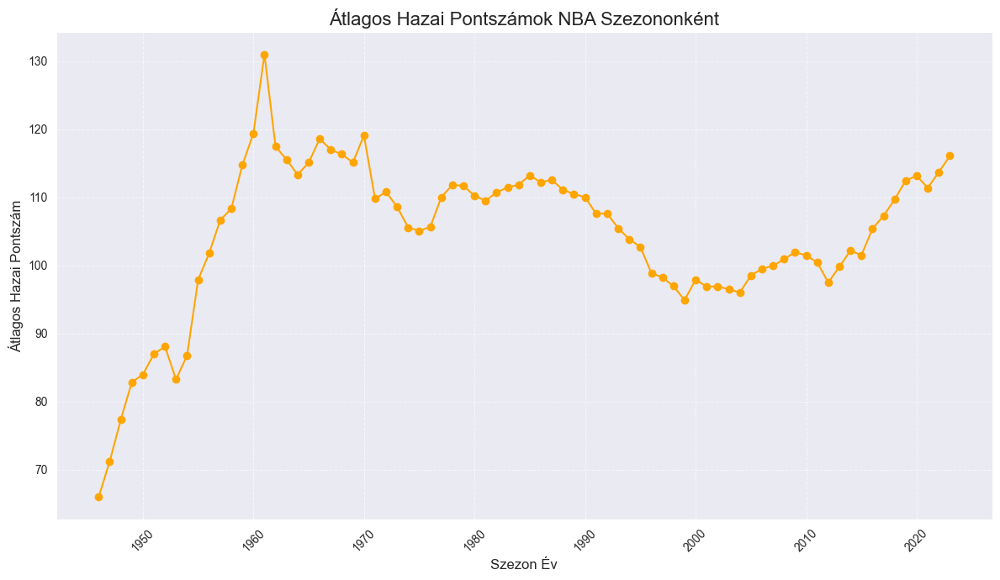

In [9]:
game_df['season_year'] = game_df['game_date'].dt.year

avg_pts_per_season = game_df.groupby('season_year')['pts_home'].mean().reset_index()

plt.figure(figsize=(12, 7))
plt.plot(avg_pts_per_season['season_year'], avg_pts_per_season['pts_home'], marker='o', linestyle='-', color='orange')
plt.title('Átlagos Hazai Pontszámok NBA Szezononként', fontsize=16)
plt.xlabel('Szezon Év', fontsize=12)
plt.ylabel('Átlagos Hazai Pontszám', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 2. Matplotlib Vizualizáció: Átlagos pontszámok szezononként (Home csapat)
Ez a grafikon elég izgalmas dolgokat mutat! Először is, a '40-es évek végétől a '60-as évek elejéig elég durván megugrott a pontszám, szinte duplájára. Gondolom, ekkoriban alakulhattak ki azok a modern játékszabályok, amiket ma is ismerünk, vagy valami forradalmi változás történt a támadójátékban.

Aztán a '60-as évektől a '90-es évek végéig elég sok ingadozással, de alapvetően egy lassú csökkenő trendet látok, mintha egyre kevesebb pont született volna átlagosan. Lehet, hogy ekkoriban a védekezés lett hangsúlyosabb, vagy lassabb lett a játék?

A 2000-es évek elején volt egy mélypont, de utána, nagyjából a 2010-es évektől kezdve megint szépen emelkedni kezdett az átlagos pontszám, és most a 2020-as évek elején már majdnem visszatért a '60-as évek eleji csúcsokhoz. Ez szerintem azt jelenti, hogy a mai kosárlabda ismét a támadójátékról szól, sok dobással és gyors tempóval. Programozói szemmel nézve, ez a grafikon azt mutatja, hogy a kosárlabda egy dinamikusan fejlődő sport, ahol a trendek idővel változnak.

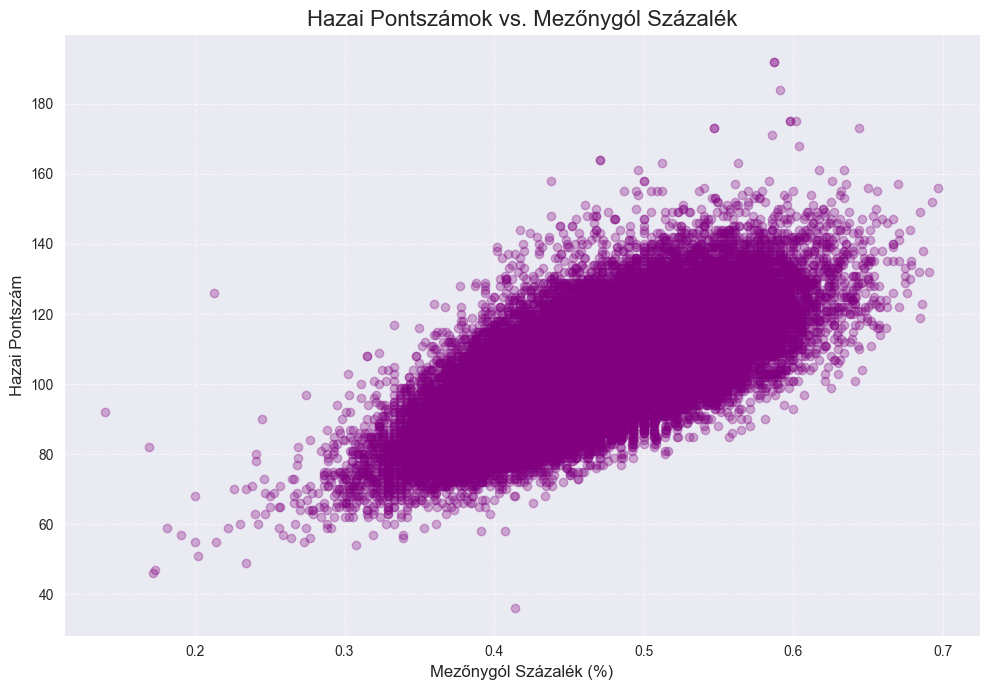

In [10]:
plt.figure(figsize=(10, 7))
plt.scatter(game_df['fg_pct_home'], game_df['pts_home'], alpha=0.3, color='purple')
plt.title('Hazai Pontszámok vs. Mezőnygól Százalék', fontsize=16)
plt.xlabel('Mezőnygól Százalék (%)', fontsize=12)
plt.ylabel('Hazai Pontszám', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# 3. Matplotlib Vizualizáció: Pontszámok és mezőnygól-százalék összefüggése (Home csapat)
Nos, ez a grafikon elég egyértelműen mutatja, amit sejtettem: minél jobb a mezőnygól-százaléka egy csapatnak, annál több pontot szerez. A pontok elég szépen eloszlanak egy felfelé ívelő "felhőben", ami megerősíti ezt az összefüggést.

Azt is látom, hogy a legtöbb meccs a 0.40 és 0.55 közötti mezőnygól-százalék tartományban, és a 90-120 pontos sávban van. Vannak persze extrém esetek, ahol nagyon rosszul dobtak (alacsony százalék) és kevés pontot szereztek, vagy épp szokatlanul jól (magas százalék) és rengeteg pontot. De összességében egyértelmű a tendencia: ha dobod, bemegy, akkor sok pontod van. Ez nem egy meglepő felfedezés, de jó látni, hogy az adatok is alátámasztják ezt az alapvető kosárlabda logikát.

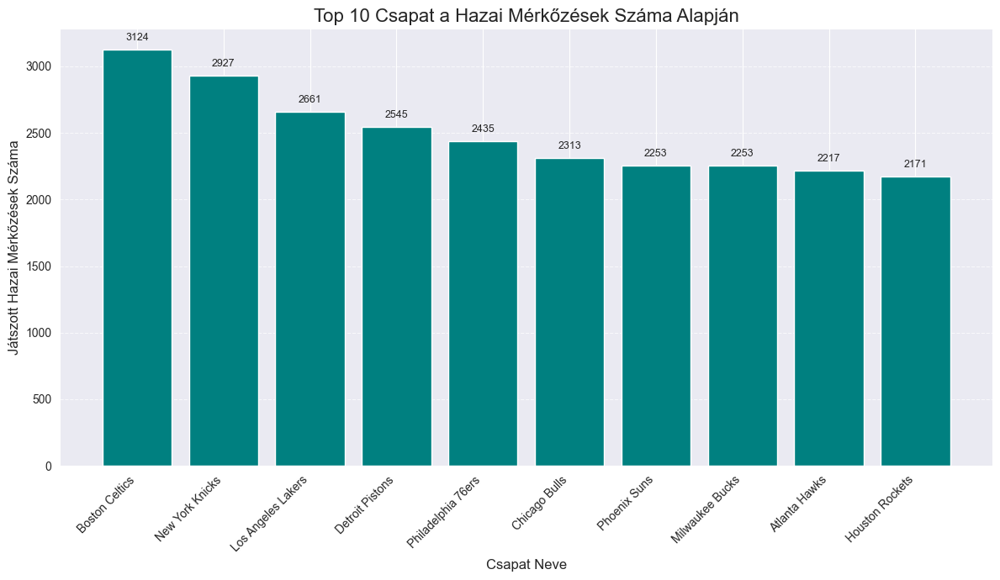

In [11]:
top_10_teams = game_df['team_name_home'].value_counts().head(10)

plt.figure(figsize=(12, 7))
bars = plt.bar(top_10_teams.index, top_10_teams.values, color='teal')
plt.title('Top 10 Csapat a Hazai Mérkőzések Száma Alapján', fontsize=16)
plt.xlabel('Csapat Neve', fontsize=12)
plt.ylabel('Játszott Hazai Mérkőzések Száma', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 50, round(yval, 0), ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()

# 4. Matplotlib Vizualizáció: Legtöbb meccset játszó csapatok (Top 10)
A grafikonból egyértelműen kiderül, hogy a Boston Celtics és a New York Knicks vezeti a sort, messze a legtöbb hazai mérkőzéssel. Őket követi a Los Angeles Lakers. Ez alapján azt tudom mondani, hogy ezek a csapatok valószínűleg a liga alapító tagjai vagy legalábbis nagyon korán csatlakoztak, és folyamatosan aktívak voltak az NBA történetében.

Érdekes, hogy bár a rangsor tetején nagy a különbség, a 6. és 10. helyezett csapatok között már sokkal szorosabb a küzdelem a lejátszott meccsek számát tekintve. Szóval, a "nagy öregek" egyértelműen uralják a statisztikát a lejátszott hazai meccsek számában, ami azt sugallja, hogy ők a liga "patinásabb" klubjai.

Azt is hozzátenném, hogy szerintem az is hozzájárulhat ehhez a magas számhoz, hogy ezek a csapatok azok, amelyek a legtöbb bajnokságot is nyerték az NBA-ben. Ez azt jelenti, hogy sokkal több playoff mérkőzést is játszottak hazai pályán, mint a többi csapat, ami persze feltornázza a lejátszott meccsek számát.



Egyedi pozíciók a common_player_info_df-ben:
['Forward' 'Center' nan 'Guard' 'Forward-Guard' 'Guard-Forward'
 'Forward-Center' 'Center-Forward' '']


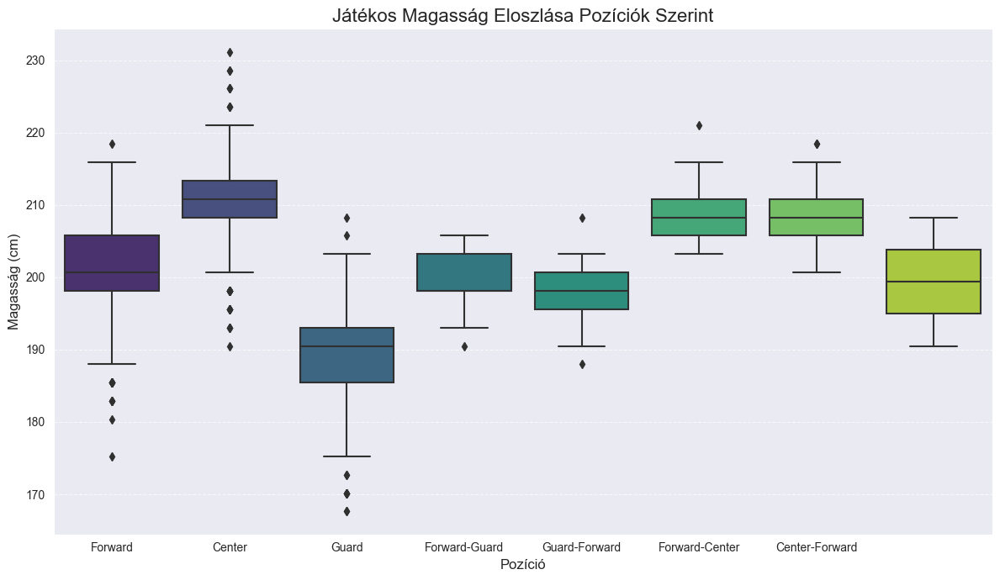

In [13]:
plt.figure(figsize=(12, 7))
sns.boxplot(x='position', y='height_in_cm', data=player_full_df.dropna(subset=['position', 'height_in_cm']), palette='viridis')
plt.title('Játékos Magasság Eloszlása Pozíciók Szerint', fontsize=16)
plt.xlabel('Pozíció', fontsize=12)
plt.ylabel('Magasság (cm)', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# 5. Seaborn Vizualizáció: Játékosok magasságának eloszlása pozíciók szerint (Dobozdiagram)
Center: Egyértelműen ők a legmagasabbak, ez nem is meglepő. A doboz (ami a középső 50%-ot mutatja) a legmagasabban van, és még a bajuszok is felfelé nyúlnak. Vannak köztük igazi égimeszelők, ami látszik a kis pöttyökből is, amik a "különc" magas játékosokat jelzik.

Guard: Na, ők a legalacsonyabbak a mezőnyben. A dobozuk szépen lent van, és a mediánjuk is a legalacsonyabb az összes közül. Ez is teljesen logikus, hisz nekik kell a leggyorsabbnak és legmozgékonyabbnak lenniük.
Forward: Középmezőny. Magasabbak a Guardoknál, de alacsonyabbak a Centereknél. Ez is rendben van, ők sok mindenben részt vesznek a pályán.

Kombinált pozíciók (pl. Forward-Center, Guard-Forward): Itt érdekes, hogy a "Forward-Center" típusú játékosok magassága nagyon hasonlít a "Center" pozícióhoz, vagyis ők is magasabbak. Míg a "Guard-Forward" inkább a Guardokhoz közelít, vagy a Forwardok alsó feléhez. Ez azt jelzi, hogy ezeknél a kombóknál az elsőként megadott poszt valószínűleg jobban meghatározza a magasságukat. Például, ha valaki "Forward-Center", akkor valószínűleg azért Center is, mert elég magas hozzá.

Szóval, a grafikon nagyon jól megmutatja, hogy a kosárlabda posztok valóban magasságbeli "szerepkört" is jelentenek. A magasság elengedhetetlen a Center pozícióhoz, míg a Guardoknak inkább az ügyesség és gyorsaság a fontosabb.


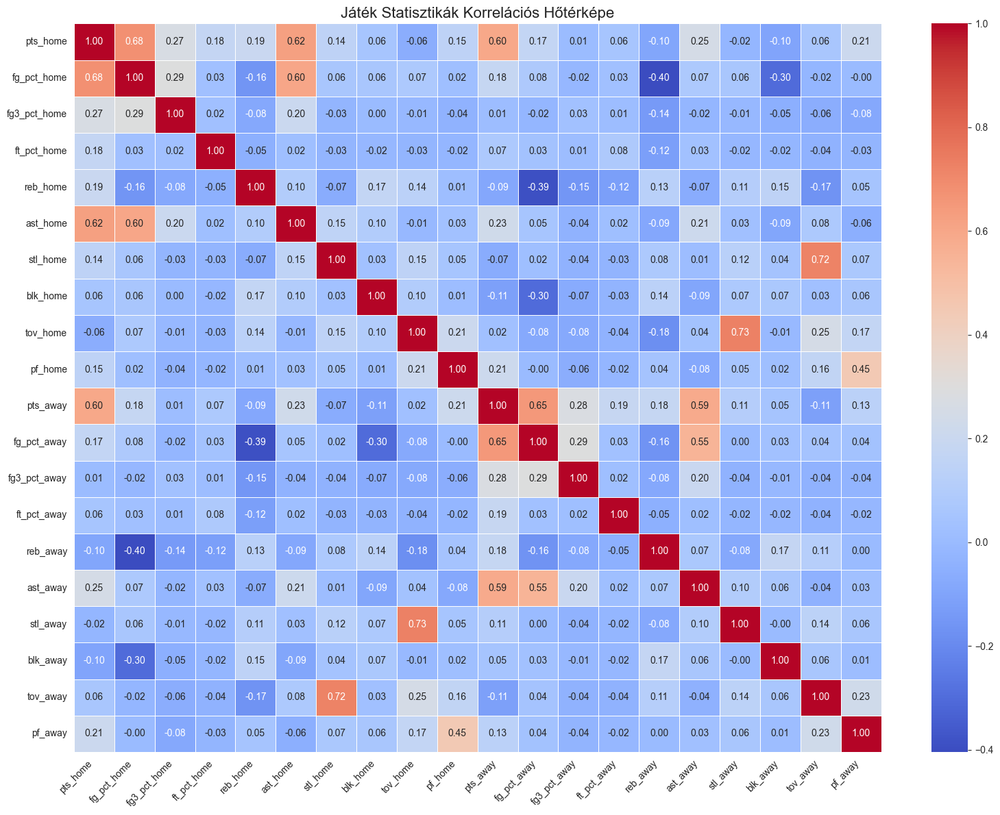

In [14]:
game_stats_cols = [
    'pts_home', 'fg_pct_home', 'fg3_pct_home', 'ft_pct_home',
    'reb_home', 'ast_home', 'stl_home', 'blk_home', 'tov_home', 'pf_home',
    'pts_away', 'fg_pct_away', 'fg3_pct_away', 'ft_pct_away',
    'reb_away', 'ast_away', 'stl_away', 'blk_away', 'tov_away', 'pf_away'
]

correlation_matrix = game_df[game_stats_cols].corr()

plt.figure(figsize=(16, 12))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Játék Statisztikák Korrelációs Hőtérképe', fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# 6. Seaborn Vizualizáció: Korrelációs Hőtérkép (game_df)
Pontszámok (pts_home és pts_away): Látom, hogy a pts_home (hazai pontszám) és fg_pct_home (hazai mezőnygól százalék) között van egy elég erős pozitív korreláció (0.68). Ez logikus, ha jól dobnak, több pontot szereznek. Ugyanez igaz az fg3_pct_home (hazai hárompontos százalék) és ft_pct_home (hazai büntető százalék) esetében is, de azok kevésbé erősek, mint a mezőnygól százalék. Szóval a lényeg, hogy a hatékony dobás viszi a pontokat.

Asszisztok (ast_home és ast_away): Az ast_home elég erősen korrelál a pts_home-mal (0.60). Ez is szuper logikus, ha sok az assziszt, az azt jelenti, hogy a csapat jól passzol, és valószínűleg könnyebb kosarakat szereznek, ergo több pontot.
Lepattanók (reb_home és reb_away): A lepattanók, főleg a reb_home és pts_home között nincs valami erős korreláció, ami érdekes. Azt hinné az ember, hogy ha sokat pattanozol, több esélyed van második dobásra, és így több pontra, de ez nem egyértelműen jön át a számból.

Eladott labdák (tov_home és tov_away): Az tov_home (hazai eladott labda) és a pts_home között van egy enyhe negatív korreláció, ami szintén értelmes: ha sok a hiba, kevesebb pontot szerzel.

Védekezés (stl, blk, pf): A stl_home (hazai labdaszerzés) és pts_home között nincs szinte semmi korreláció. A blk_home (hazai blokk) és pts_home között is alig. A pf_home (hazai fault) és pts_home között pedig egy enyhe negatív. Ez azt sugallja, hogy bár a védekezés fontos, a nyers támadó statisztikák (dobószázalék, asszisztok) sokkal közvetlenebbül kapcsolódnak a végső pontszámhoz.

Összességében a kép azt mutatja, hogy a dobóhatékonyság és a passzjáték a legfontosabb tényezők, amik a pontszámot befolyásolják. A védekező statisztikák, mint a labdaszerzés vagy a blokkolás, vagy a lepattanók, nem mutatnak olyan közvetlen és erős összefüggést a szerzett pontokkal, mint a támadó mutatók.


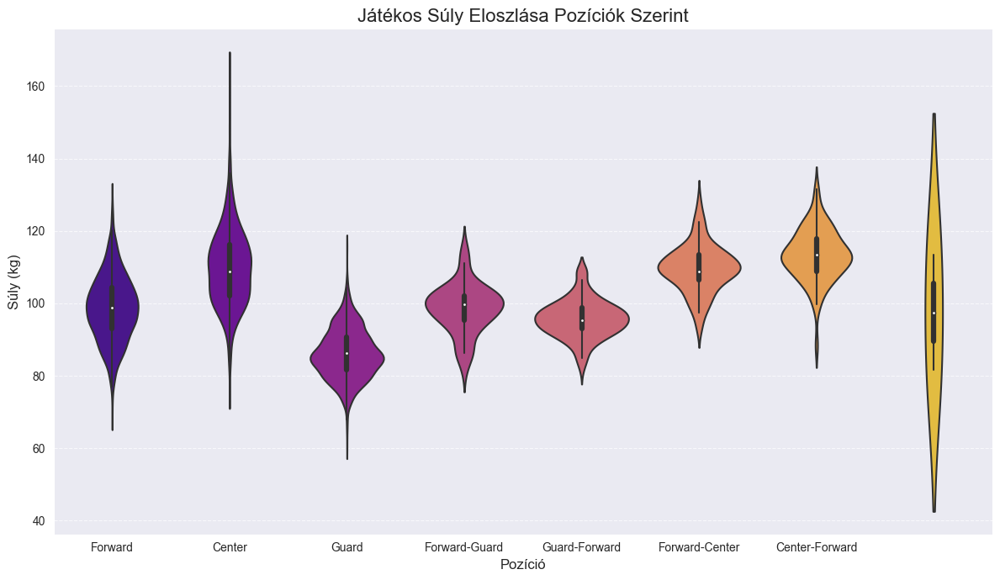

In [16]:
plt.figure(figsize=(12, 7))
sns.violinplot(x='position', y='weight_in_kg', data=player_full_df.dropna(subset=['position', 'weight_in_kg']), palette='plasma')
plt.title('Játékos Súly Eloszlása Pozíciók Szerint', fontsize=16)
plt.xlabel('Pozíció', fontsize=12)
plt.ylabel('Súly (kg)', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# 7. Seaborn Vizualizáció: Játékosok súlyának eloszlása pozíciók szerint (Violin Plot)
Ez a vizualizáció a játékosok testsúlyának eloszlását mutatja be az NBA-ben, különböző posztokra lebontva. A célom az volt, hogy feltárjam, a magassághoz hasonlóan, a súly is szignifikánsan eltér-e az egyes pozíciók között, és milyen tendenciák figyelhetők meg ezen a téren.

Következtetés a fenti grafikonból:
Ez a "hegedűs" ábra elég jól megmutatja a súlyeloszlást, és nem meglepő módon nagyon hasonlít a magasságra.

Center: Egyértelműen ők a legnehezebbek, ahogy várható volt. A hegedű alakjuk is a legszélesebb a magasabb súlyok felé, ami azt jelenti, hogy itt van a legtöbb igazán súlyos játékos. Vannak extrém nehezek is, ahogy a "hegedűnyak" egészen felnyúlik.

Guard: ők a legkönnyebbek, ahogy a magasságnál is ők voltak a legalacsonyabbak. A hegedű alak is a legkeskenyebb, és a súlyuk szépen a 80-100 kg környékére koncentrálódik.

Forward: Megint a középső kategória. Nehezebbek, mint a Guardok, de könnyebbek, mint a Centerek.
Kombinált pozíciók (pl. Forward-Center, Guard-Forward): Itt is hasonló a helyzet, mint a magasságnál. A "Forward-Center" típusú játékosok súlya közelebb van a Centerekhez, vagyis ők is robusztusabbak. A "Guard-Forward" pedig valahol a Guard és a Forward súlya között helyezkedik el.

Szóval, a kép elég világos: minél magasabb valaki, annál valószínűbb, hogy nehezebb is, ami a kosárlabdában teljesen logikus. A Centereknek kell a legtöbbet birkózniuk a palánk alatt, szóval jól jön nekik a súly, míg a Guardoknak a gyorsaság és a könnyedség fontosabb. A grafikából látszik, hogy a súlyeloszlás is nagyban függ a pozíciótól, és szépen illeszkedik ahhoz, amit a magasságról már megtudtam.


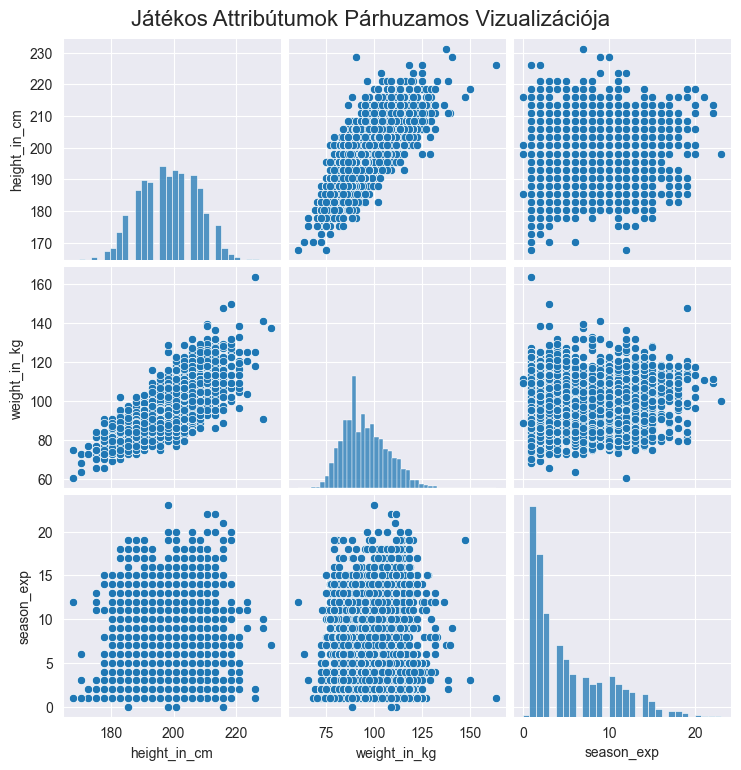

In [17]:
player_numeric_cols = [
    'height_in_cm',  # Magasság centiméterben
    'weight_in_kg',  # Súly kilogrammban
    'season_exp'     # Szezon tapasztalat (ez maradhat így)
]

plot_df = player_full_df[player_numeric_cols].dropna()

sns.pairplot(plot_df)
plt.suptitle('Játékos Attribútumok Párhuzamos Vizualizációja', y=1.02, fontsize=16)
plt.show()

# 8. Seaborn Vizualizáció: Numerikus attribútumok közötti kapcsolatok (Pairplot)

Ez a "pairplot" rengeteg összefüggést megmutat, nagyon hasznos egy gyors áttekintéshez:

**Magasság vs. Súly (felső középső és középső bal grafikon):**

* Ez szuper egyértelmű: minél magasabb egy játékos, annál nehezebb. A pontok szépen egy felfelé ívelő vonalat alkotnak, ami erős pozitív korrelációt jelez. Nincsenek meglepetések, ez így logikus.
* A hisztogramok (átlósan) is megerősítik a korábbi megfigyeléseket: a magasság a 190-210 cm között, a súly pedig a 90-110 kg körül a leggyakoribb.

**Magasság vs. Tapasztalat (felső jobb és alsó bal grafikon):**

* Itt már jóval szórtabb a kép. Bár van egy nagyon enyhe tendencia, hogy a magasabb játékosok között talán több a tapasztaltabb, vagy fordítva, de ez annyira gyenge, hogy nem lehet rá egyértelmű következtetést levonni. Inkább úgy tűnik, hogy a magasságnak nincs erős összefüggése a játékban eltöltött évek számával.
* A hisztogram a tapasztalatnál azt mutatja, hogy a legtöbb játékosnak viszonylag kevés tapasztalata van (pár szezon), és ahogy nő a lejátszott szezonok száma, úgy csökken a játékosok száma – ami szintén teljesen logikus, hiszen minél idősebb valaki, annál valószínűbb, hogy abbahagyja.

**Súly vs. Tapasztalat (középső jobb és alsó középső grafikon):**

* Ugyanaz, mint a magasság és a tapasztalat esetén: nincs erős összefüggés a testsúly és a játékban eltöltött évek között. A pontok nagyon szétszóródnak, nem látszik semmilyen egyértelmű trend. Egy játékos súlya nem feltétlenül jelez előre a tapasztalatára vonatkozóan, és fordítva.

**Összegzésképp:** A magasság és a súly szorosan összefügg, ami a kosárlabdában elvárható. Viszont sem a magasság, sem a súly nem mutat erős korrelációt azzal, hogy egy játékos hány szezont játszott már a ligában. A tapasztalat egy teljesen más dimenzió, ami valószínűleg nem a fizikai attribútumoktól függ elsősorban, hanem mondjuk a kitartástól, a tehetségtől és persze a szerencsétől.

In [19]:
fig = px.scatter(game_df,
                 x='pts_home',
                 y='pts_away',
                 title='Hazai vs. Vendégcsapat Pontszámok NBA Mérkőzéseken',
                 labels={'pts_home': 'Hazai Csapat Pontszám', 'pts_away': 'Vendégcsapat Pontszám'},
                 hover_name='game_date',
                 hover_data=['team_name_home', 'team_name_away', 'wl_home', 'wl_away'])
fig.update_layout(xaxis_title_text='Hazai Csapat Pontszám',
                  yaxis_title_text='Vendégcsapat Pontszám')
fig.show()

# 9. Plotly Vizualizáció: Hazai és vendégcsapat pontszámok (Interaktív szóródiagram)
### Hazai vs. Vendégcsapat Pontszámok NBA Mérkőzéseken

Ezen a scatter ploton azt vizsgáltam meg, hogy egy adott NBA meccsen a hazai csapat és a vendégcsapat által szerzett pontszámok hogyan viszonyulnak egymáshoz. Egyszerűen csak arra voltam kíváncsi, hogy ha az egyik csapat sokat dob, akkor a másik is sokat dob-e, vagy épp ellenkezőleg, van-e valami kapcsolat a pontjaik között.

---

### Következtetés a fenti grafikonból:

Ez a grafikon egy elég masszív pontfelhő, de azért lehet belőle következtetéseket levonni!

* **Pozitív korreláció:** Jól látható, hogy van egy általános felfelé ívelő tendencia a pontok között. Ez azt jelenti, hogy **minél több pontot szerez a hazai csapat, annál valószínűbb, hogy a vendégcsapat is több pontot szerez**, és fordítva. Ez szerintem azt jelzi, hogy a magas pontszámú meccsek általában mindkét csapat számára magas pontszámot jelentenek, valószínűleg gyorsabb tempójú, támadóbb jellegű mérkőzések ezek.
* **Sűrűség a középmezőnyben:** A legtöbb pont a 90 és 130 pont közötti tartományban koncentrálódik mind a hazai, mind a vendégcsapatok esetében. Ez azt mutatja, hogy a meccsek többsége ebbe a "normál" pontszám-tartományba esik.
* **Extrém esetek:** Vannak persze kilengések is, meccsek, ahol nagyon alacsony a pontszám mindkét oldalon (bal alsó sarok), és olyanok is, ahol mindkét csapat extrém sokat dobott (jobb felső sarok). De ezek viszonylag ritkábbak, ahogy a pontok sűrűsége is ritkább ezeken a széleken.
* **Nincs "egymás rovására" elv:** A grafikon nem azt mutatja, hogy ha az egyik csapat rengeteget dob, akkor a másik szükségszerűen keveset. Inkább azt, hogy a támadójáték minősége és a mérkőzés tempója valószínűleg hatással van mindkét csapat teljesítményére. Ha egy meccs pörög, mindkét csapatnak több lehetősége van pontot szerezni.

Szóval, a meccs pontszámát valószínűleg sok tényező befolyásolja, és nem feltétlenül arról szól, hogy ha én sokat szerzek, akkor te keveset. Inkább az egész meccs karaktere, tempója határozza meg, mennyire lesz "pontgazdag".


In [22]:
team_df['founding_decade'] = (team_df['year_founded'] // 10) * 10
team_df['founding_decade_label'] = team_df['founding_decade'].apply(lambda x: f'{x}s')

team_df_sorted = team_df.sort_values(by='year_founded', ascending=True)

fig = px.bar(team_df_sorted,
             x='full_name',
             y='year_founded',
             color='founding_decade_label',
             title='NBA Csapatok Alapítási Éve (Évtizedek szerint)',
             labels={'full_name': 'Csapat Neve', 'year_founded': 'Alapítás Éve', 'founding_decade_label': 'Alapítási Évtized'},
             hover_data=['city', 'state', 'abbreviation'])

fig.update_layout(xaxis_tickangle=-45)
# Itt adjuk meg a y-tengely tartományát
fig.update_yaxes(range=[1940, 2010]) # Például 1940-től 2010-ig

fig.show()

# 10. Plotly Vizualizáció: NBA Csapatok Alapítási Éve Évtizedek Szerint

Ez a vizualizáció az NBA csapatok alapítási évét mutatja be egy interaktív sávdiagram segítségével, ahol az oszlopok színét az alapítás évtizede határozza meg. Célom az volt, hogy áttekintést nyerjek a liga történelmi fejlődéséről a csapatok alapításának időpontja alapján, és azonosítsam azokat az időszakokat, amikor a legtöbb franchise létrejött vagy csatlakozott.

---

### Következtetés a fenti grafikonból:

A vizualizáció egyértelműen bemutatja az NBA csapatok alapításának időbeli eloszlását évtizedes bontásban.

* **A liga korai alapjai (1940-es évek):** A grafikon bal oldalán lévő nagyszámú kék színű oszlop jelzi, hogy a liga jelenlegi csapatainak jelentős része az 1940-es években, az NBA megalakulásának és korai éveinek idején jött létre. Ez a blokk magában foglalja az olyan patinás klubokat, mint a Boston Celtics és a New York Knicks, hangsúlyozva a liga hosszú és gazdag történelmét.
* **Folyamatos növekedés és bővítés (1960-as évektől a 2000-es évekig):** A további színblokkok (narancssárga az 1960-as évek, zöld az 1970-es évek, lila az 1980-as évek, stb.) jól láthatóan jelzik, hogy az NBA története során folyamatosan bővült új franchise-okkal. Ez a terjeszkedés nem egyetlen nagy hullámban, hanem több évtizeden keresztül zajlott, ahogy a liga növekedett és új piacokat célzott meg.
* **Különbségek az alapítási időpontokban:** Bár a legtöbb csapat az 1940-es évekre tehető, jelentős számú klub alakult az 1960-as, 1970-es és későbbi évtizedekben is. Ez a megoszlás rávilágít a liga dinamikus fejlődésére és arra, hogy az idő múlásával új entitások is csatlakoztak a bajnoksághoz.

Összességében a grafikon átfogó képet nyújt az NBA csapatstruktúrájának történelmi kialakulásáról, megerősítve a liga jelentős korai alapjait és a folyamatos, de szakaszos bővítését az évtizedek során.

In [31]:
conn = None
try:
    conn = sqlite3.connect(db_file)
    officials_df = pd.read_sql_query("SELECT * FROM officials;", conn)
except sqlite3.Error:
    exit()
finally:
    if conn:
        conn.close()

if not officials_df.empty:
    officials_df['full_name'] = officials_df['first_name'] + ' ' + officials_df['last_name']
    games_officiated_by_official = officials_df['full_name'].value_counts().reset_index()
    games_officiated_by_official.columns = ['official_name', 'games_officiated']
    top_10_officials = games_officiated_by_official.head(10).sort_values(by='games_officiated', ascending=True)

    fig = px.bar(top_10_officials,
                 x='games_officiated',
                 y='official_name',
                 orientation='h',
                 title='A Legtöbbet Szereplő NBA Játékvezetők (Mérkőzések Száma)',
                 labels={'games_officiated': 'Mérkőzések Száma', 'official_name': 'Játékvezető Neve'},
                 hover_data=['games_officiated'])

    fig.update_layout(
        yaxis_title='Játékvezető Neve',
        xaxis_title='Mérkőzések Száma',
        title_x=0.5,
        showlegend=False
    )
    fig.show()

# 11. Plotly Vizualizáció: A Legtöbbet Szereplő NBA Játékvezetők

Ez a vizualizáció azokat az NBA játékvezetőket mutatja be, akik a legtöbb mérkőzésen működtek közre. Célom volt azonosítani a legtapasztaltabb és leggyakrabban bevetett bírókat az adatbázisban szereplő időszak alatt, ami rávilágíthat a játékvezetés stabilitására és a kulcsfigurákra ebben a szerepkörben.

---

### Következtetés a fenti grafikonból:

A horizontális sávdiagram egyértelműen bemutatja, mely játékvezetők vezették a legtöbb NBA mérkőzést.

* **Tapasztalt játékvezetők:** A lista élén olyan nevek állnak, mint Scott Foster és Marc Davis, akik mindannyian több mint 1200 mérkőzésen működtek közre. Ez a magas mérkőzésszám kiemelkedő tapasztalatra utal, és arra, hogy ezek a játékvezetők hosszú éveken át, folyamatosan a liga élvonalában voltak.
* **A "mag" csoport:** Látható, hogy a top 10 játékvezető mindegyike 1100 feletti mérkőzésszámmal rendelkezik, Scott Foster pedig közel 1300-zal vezeti a listát. Ez arra enged következtetni, hogy van egy stabil, tapasztalt magja a játékvezetőknek az NBA-ben, akik kulcsszerepet játszanak a mérkőzések lebonyolításában.
* **Hosszú karrier:** A több mint ezer mérkőzés levezetése azt jelenti, hogy ezek a személyek valószínűleg több évtizedes pályafutással rendelkeznek a ligában, ami elengedhetetlen a játékszabályok mélyreható ismeretéhez és a folyamatos, magas szintű teljesítmény fenntartásához.

Összességében a grafikon megerősíti, hogy a játékvezetésben is vannak "vasemberek", akik rendkívül hosszú és aktív karriert futottak be, stabil és megbízható alapot nyújtva az NBA mérkőzések számára.

In [30]:
import pandas as pd
import plotly.express as px
import sqlite3

db_file = './nba.sqlite'

conn = None
try:
    conn = sqlite3.connect(db_file)
    player_df = pd.read_sql_query("SELECT * FROM player;", conn)
    common_player_info_df = pd.read_sql_query("SELECT * FROM common_player_info;", conn)
except sqlite3.Error:
    exit()
finally:
    if conn:
        conn.close()

player_full_df = pd.merge(player_df, common_player_info_df, left_on='id', right_on='person_id', how='left')

plot_data = player_full_df.dropna(subset=['season_exp'])

fig = px.histogram(plot_data,
                   x='season_exp',
                   title='NBA Játékosok Tapasztalatának Eloszlása (Lejátszott Szezonok Száma)',
                   labels={'season_exp': 'Lejátszott Szezonok Száma', 'count': 'Játékosok Száma'},
                   nbins=20,
                   color_discrete_sequence=px.colors.sequential.Plotly3)

fig.update_layout(xaxis_title='Lejátszott Szezonok Száma',
                  yaxis_title='Játékosok Száma',
                  title_x=0.5)

fig.show()

# 12. Plotly Vizualizáció: NBA Játékosok Tapasztalatának Eloszlása

Ez a hisztogram az NBA játékosok tapasztalatának eloszlását szemlélteti, a lejátszott szezonok száma alapján. A célom az volt, hogy felmérjem, milyen arányban találhatók a ligában friss, illetve tapasztalt játékosok, és hogyan oszlik meg a karrierhosszúság a teljes játékosállományban.

---

### Következtetés a fenti grafikonból:

A vizualizáció egyértelműen bemutatja a játékosok tapasztalatának eloszlását, és néhány fontos tendenciára világít rá:

* **Rövid karrier a többség számára:** A hisztogram egyértelműen azt mutatja, hogy a játékosok legnagyobb része viszonylag kevés szezont tölt el az NBA-ben. A legnagyobb oszlop az 1-2 lejátszott szezon körüli tartományban található, ami azt jelzi, hogy sok játékos karrierje viszonylag rövid.
* **A tapasztalattal rendelkezők arányának csökkenése:** Ahogy növekszik a lejátszott szezonok száma (az x-tengelyen jobbra haladva), a játékosok száma (az y-tengelyen) folyamatosan csökken. Ez logikus, hiszen minél több szezont játszik valaki, annál ritkábbá válik, és annál valószínűbb, hogy abbahagyja a profi kosárlabdát, vagy valamilyen okból kikerül a ligából.
* **Hosszú karrier ritkasága:** Bár vannak játékosok, akik 15-20, vagy akár annál is több szezont játszottak, ők rendkívül ritkák. A grafikon jobb oldala szinte el is laposodik, jelezve a hosszú távú NBA karrierek exkluzivitását.

Összességében a grafikon megerősíti azt az elképzelést, hogy az NBA-be bekerülni már önmagában is nehéz, de benne maradni, és hosszú, sikeres karriert építeni még inkább kivételes teljesítményt igényel. A liga fluktuációja jelentős, és a legtöbb játékosnak viszonylag rövid időre adatik meg a profi karrier.